In [58]:
import os
import numpy as np
from scipy.fftpack import dct
from scipy.signal import cwt
from pywt import dwt2
from skimage.io import imread, imshow
from skimage.measure import shannon_entropy
import matplotlib.pyplot as plt
from IPython import display

from utils import (
    SoftThresh,
    ShrinkageOperator,
    Proj
)

%matplotlib inline

## Import an image to compress and reconstruct

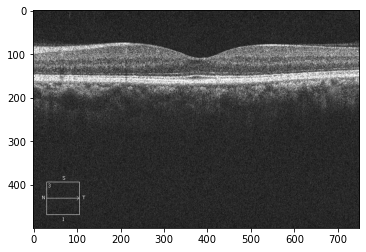

In [59]:
image_path = "OCTID_NORMAL"
image_name = "NORMAL10.jpeg"
image = os.path.join(image_path, image_name)

oct_image = imread(image)
plt.imshow(oct_image, cmap='gray')

# Taking the first of the 3 channels, as they are all the same.
X = oct_image[:,:,0]
plt.imshow(oct_image, cmap='gray')

## Vary The compression levels for our image

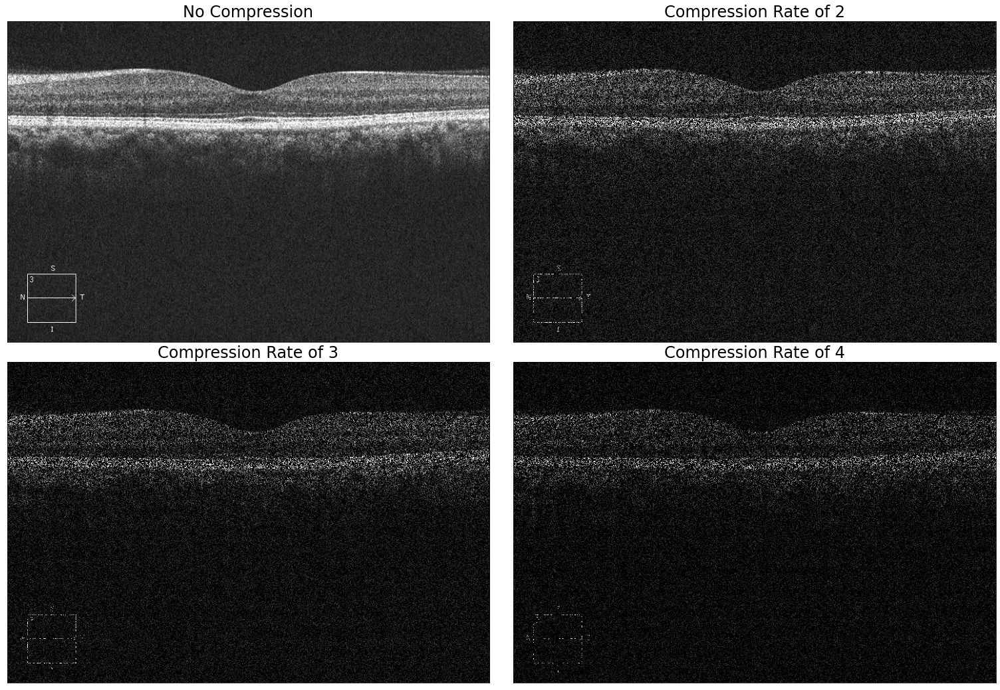

In [173]:
compression = [1, 2, 3, 4]
compressed_images = []
compression_masks = []
h, w = X.shape

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(21, 15.5))
for i, cmprsn_rate in enumerate(compression):
    mask = np.random.binomial(size=(h, w), n=1, p=1/cmprsn_rate)
    compressed_images.append(X*mask)
    compression_masks.append(mask)
    
    axes[i//2][i%2].set_aspect('equal')
    if i == 0:
        axes[i//2][i%2].set_title(f"No Compression", fontsize=24)
    else:
        axes[i//2][i%2].set_title(f"Compression Rate of {cmprsn_rate}", fontsize=24)
    axes[i//2][i%2].imshow(X*mask, cmap="gray")
    axes[i//2][i%2].set_xticks([])
    axes[i//2][i%2].set_yticks([])
    
    
    
fig.tight_layout()
fig.subplots_adjust(wspace=0.05, hspace=-0.1)

fig.set_facecolor('white')
plt.savefig("Compressed_Images.png", dpi=400)

# For each Compression Rate, run a rough Hyperparameter search for both Low-Rank and Sparsity minimization

# Set up our initial variables for the $\ell_{1}$ norm minimization problem

W is the variable that we are trying to optimize with repect to. W is used as the weights for our chosen basis vectors, and we seek to enforce that $\mathcal{P}_{\Omega}(B_{1} W B_{2}^{\mathbf{T}}) \approx \mathcal{P}_{\Omega}(X)$, and that we have either $\text{rank}(W) \leq k$m for some small value of $k$, or that $\lVert W \rVert_{0}$ is small, or both. (We want matrix $W$ to be sparse/lowrank). 

### set basis = 'dct' to use discrete cosine basis or to "wavelet" to use a wavelet basis.

In [70]:
# basis_ = "dct"

if basis_ == "dct":
    B1 = dct(np.eye(h), norm='ortho', axis=0).T
    B2t = dct(np.eye(w), norm='ortho', axis=0)
else: 
    # pywt.dwt2 is the discrete wavelet transform in 2D. It returns the transformed array
    # in 4 equaly sized block matrices which are simplpy regions of the entire 2D transform
    (cA, (cH, cV, cD)) = dwt2(np.eye(h), 'db1')
    upper = np.concatenate([cA, cH])
    lower = np.concatenate([cV, cD])
    B1 = np.concatenate([upper, lower], axis=1)
    
    (cA, (cH, cV, cD)) = dwt2(np.eye(w), 'db1')
    upper = np.concatenate([cA, cH])
    lower = np.concatenate([cV, cD])
    B2t = np.concatenate([upper, lower], axis=1)


W_start = []
for D in compressed_images:
    W_start.append(np.linalg.inv(B1) @ D @ np.linalg.inv(B2t))

a = 1
tau = 1

# range of hyperparameters to weight the reconstruction loss against the sparsity loss
lbda_search_space = np.concatenate([np.array([0.25, 0.5]), np.arange(1, 10, 1)])

In [71]:
results_low_rank_compresssion_3 = {}
results_low_rank_compresssion_4 = {}

results_sparse_compresssion_3 = {}
results_sparse_compresssion_4 = {}

In [72]:
def Update1(mask, B1, B2t, W, D, a):
    # Minimize the error with respect to constraint P_{\Omega}(B1 @ W @ B2t) == P_{\Omega}
    Z = Proj(B1 @ W @ B2t, mask) - D
    Z = B1.T @ Z @ B2t.T
    return W - a*Z

# Main loop in the Hyperparameter Search

### Start with Compression Ratio of 3

In [74]:
iters = 1500

for lbda in np.arange(10, 25, 1):
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[0]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[0], B1, B2t, W, compressed_images[0], a)
        W = ShrinkageOperator(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_low_rank_compresssion_3[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 3
	Iteration 1:	Reconstruction Error: 37286.45	Spectral Norm W: 398268.55	Sparisty of W: 60463.10
	Iteration 51:	Reconstruction Error: 37181.80	Spectral Norm W: 396154.33	Sparisty of W: 60567.60
	Iteration 101:	Reconstruction Error: 37077.60	Spectral Norm W: 394052.02	Sparisty of W: 60672.21
	Iteration 151:	Reconstruction Error: 36973.85	Spectral Norm W: 391961.80	Sparisty of W: 60777.38
	Iteration 201:	Reconstruction Error: 36870.55	Spectral Norm W: 389883.88	Sparisty of W: 60882.81
	Iteration 251:	Reconstruction Error: 36767.71	Spectral Norm W: 387818.47	Sparisty of W: 60988.29
	Iteration 301:	Reconstruction Error: 36665.32	Spectral Norm W: 385765.80	Sparisty of W: 61093.87
	Iteration 351:	Reconstruction Error: 36563.38	Spectral Norm W: 383726.08	Sparisty of W: 61199.91
	Iteration 401:	Reconstruction Error: 36461.89	Spectral Norm W: 381699.58	Sparisty of W: 61306.02
	Iteration 451:	Reconstruction Error: 36360.86	Spectral Norm W: 379686

	Iteration 351:	Reconstruction Error: 32060.93	Spectral Norm W: 305137.22	Sparisty of W: 66753.48
	Iteration 401:	Reconstruction Error: 31407.28	Spectral Norm W: 295983.88	Sparisty of W: 67724.77
	Iteration 451:	Reconstruction Error: 30772.62	Spectral Norm W: 287470.41	Sparisty of W: 68703.42
	Iteration 501:	Reconstruction Error: 30156.28	Spectral Norm W: 279531.48	Sparisty of W: 69683.72
	Iteration 551:	Reconstruction Error: 29557.73	Spectral Norm W: 272104.77	Sparisty of W: 70668.50
	Iteration 601:	Reconstruction Error: 28976.49	Spectral Norm W: 265153.36	Sparisty of W: 71657.76
	Iteration 651:	Reconstruction Error: 28411.99	Spectral Norm W: 258641.19	Sparisty of W: 72648.50
	Iteration 701:	Reconstruction Error: 27863.83	Spectral Norm W: 252534.09	Sparisty of W: 73640.10
	Iteration 751:	Reconstruction Error: 27331.53	Spectral Norm W: 246806.25	Sparisty of W: 74635.09
	Iteration 801:	Reconstruction Error: 26814.64	Spectral Norm W: 241434.24	Sparisty of W: 75657.48
	Iteration 851:	Reco

	Iteration 701:	Reconstruction Error: 19264.53	Spectral Norm W: 182115.05	Sparisty of W: 95936.19
	Iteration 751:	Reconstruction Error: 18518.47	Spectral Norm W: 178042.57	Sparisty of W: 98706.69
	Iteration 801:	Reconstruction Error: 17817.11	Spectral Norm W: 174412.89	Sparisty of W: 101437.64
	Iteration 851:	Reconstruction Error: 17158.25	Spectral Norm W: 171167.95	Sparisty of W: 104123.50
	Iteration 901:	Reconstruction Error: 16540.00	Spectral Norm W: 168260.28	Sparisty of W: 106771.47
	Iteration 951:	Reconstruction Error: 15960.71	Spectral Norm W: 165651.39	Sparisty of W: 109354.59
	Iteration 1001:	Reconstruction Error: 15418.79	Spectral Norm W: 163309.22	Sparisty of W: 111871.81
	Iteration 1051:	Reconstruction Error: 14912.72	Spectral Norm W: 161205.60	Sparisty of W: 114317.21
	Iteration 1101:	Reconstruction Error: 14441.07	Spectral Norm W: 159316.03	Sparisty of W: 116675.25
	Iteration 1151:	Reconstruction Error: 14002.36	Spectral Norm W: 157618.96	Sparisty of W: 118942.12
	Iterati

	Iteration 1051:	Reconstruction Error: 11006.88	Spectral Norm W: 146458.67	Sparisty of W: 137829.89
	Iteration 1101:	Reconstruction Error: 10762.55	Spectral Norm W: 145764.71	Sparisty of W: 139867.89
	Iteration 1151:	Reconstruction Error: 10556.42	Spectral Norm W: 145200.69	Sparisty of W: 141693.12
	Iteration 1201:	Reconstruction Error: 10383.39	Spectral Norm W: 144745.59	Sparisty of W: 143335.53
Starting Optimizer with lambda=9.0, compression 3
	Iteration 1:	Reconstruction Error: 37213.49	Spectral Norm W: 393893.55	Sparisty of W: 60431.25
	Iteration 51:	Reconstruction Error: 33734.00	Spectral Norm W: 328304.37	Sparisty of W: 64378.98
	Iteration 101:	Reconstruction Error: 30727.70	Spectral Norm W: 284534.80	Sparisty of W: 68684.63
	Iteration 151:	Reconstruction Error: 28094.03	Spectral Norm W: 252727.42	Sparisty of W: 73128.54
	Iteration 201:	Reconstruction Error: 25785.03	Spectral Norm W: 228894.66	Sparisty of W: 77693.98
	Iteration 251:	Reconstruction Error: 23757.19	Spectral Norm W:

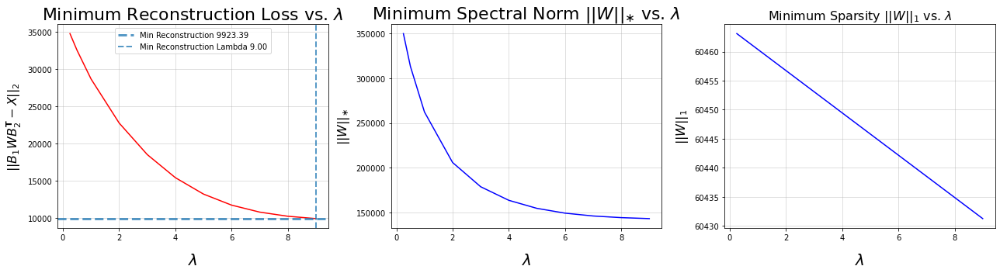

In [117]:
min_reconstruction = [min(results_low_rank_compresssion_3[l]['reconstruction']) for l in results_low_rank_compresssion_3.keys()]
final_spectral = [min(results_low_rank_compresssion_3[l]['spectral']) for l in results_low_rank_compresssion_3.keys()]
final_sparse = [min(results_low_rank_compresssion_3[l]['sparsity']) for l in results_low_rank_compresssion_3.keys()]
lambda_vals = list(results_low_rank_compresssion_3.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_low_rank_compresssion_3.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)

axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_low_rank_compresssion_3.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_low_rank_compresssion_3.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Low Rank, Compression Rate of 3", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("Low_rank_compression_3_hyperparam_plots.png", dpi=400)
plt.show()

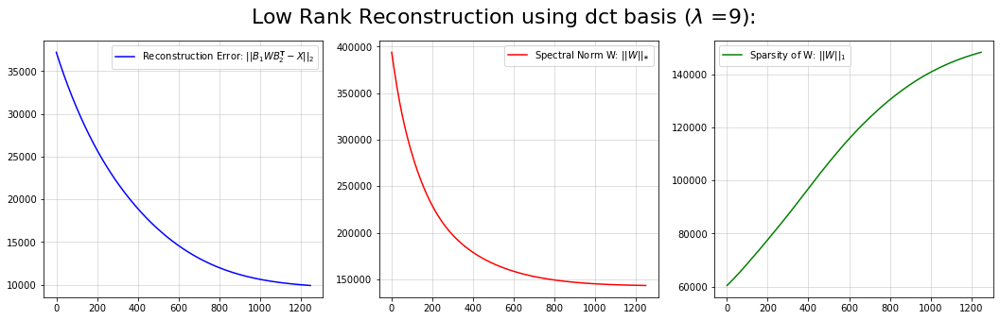

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

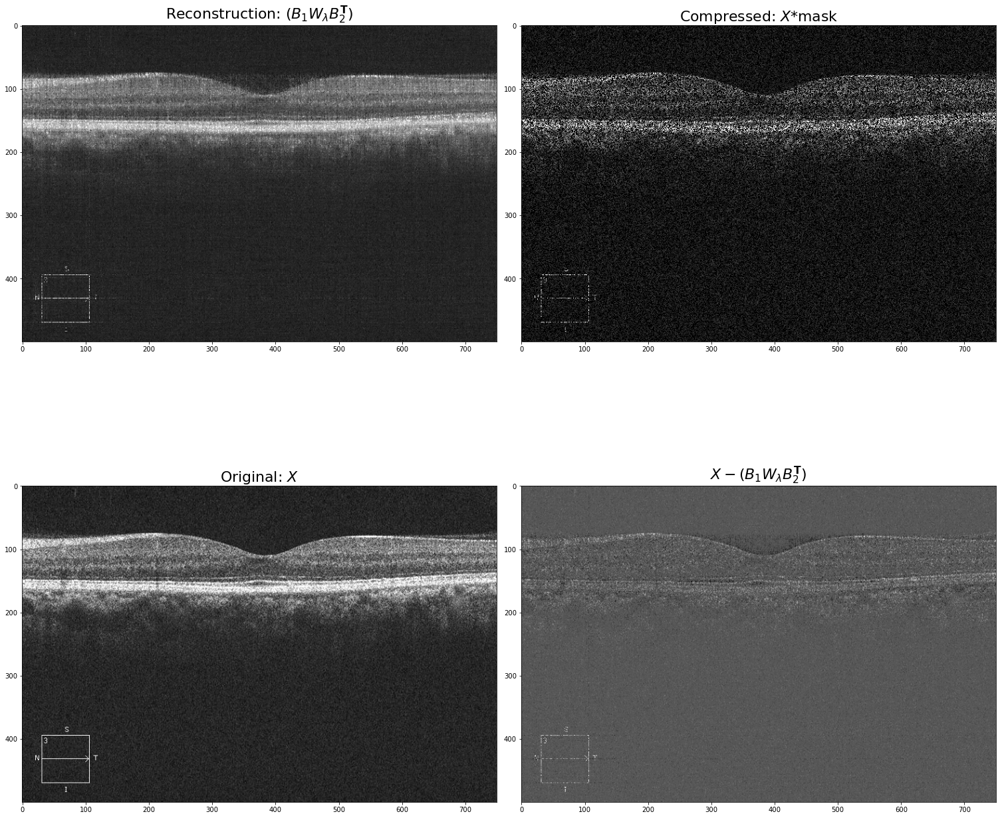

In [126]:
lbda_ = 9
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_low_rank_compresssion_3[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_low_rank_compresssion_3[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_low_rank_compresssion_3[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

fig.suptitle(f"Low Rank Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

fig.set_facecolor('white')
plt.savefig("Low_rank_compression_3_lambda_9_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_low_rank_compresssion_3[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_low_rank_compresssion_3[lbda_]['W'] @ B2t), cmap="gray")

plt.tight_layout()
plt.show()

### Compression Rate of 4

In [76]:
iters = 1500

for lbda in lbda_search_space:
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[0]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[1]     
    for i in range(iters):
        W = Update1(compression_masks[1], B1, B2t, W, compressed_images[1], a)
        W = ShrinkageOperator(W, lbda)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_low_rank_compresssion_4[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 3
	Iteration 1:	Reconstruction Error: 39655.20	Spectral Norm W: 359824.63	Sparisty of W: 45579.75
	Iteration 51:	Reconstruction Error: 39566.42	Spectral Norm W: 357962.63	Sparisty of W: 45689.76
	Iteration 101:	Reconstruction Error: 39478.04	Spectral Norm W: 356111.42	Sparisty of W: 45800.06
	Iteration 151:	Reconstruction Error: 39390.08	Spectral Norm W: 354271.19	Sparisty of W: 45910.45
	Iteration 201:	Reconstruction Error: 39302.51	Spectral Norm W: 352442.12	Sparisty of W: 46020.88
	Iteration 251:	Reconstruction Error: 39215.36	Spectral Norm W: 350624.44	Sparisty of W: 46131.33
	Iteration 301:	Reconstruction Error: 39128.61	Spectral Norm W: 348818.36	Sparisty of W: 46241.89
	Iteration 351:	Reconstruction Error: 39042.27	Spectral Norm W: 347024.12	Sparisty of W: 46353.11
	Iteration 401:	Reconstruction Error: 38956.33	Spectral Norm W: 345242.00	Sparisty of W: 46464.82
	Iteration 451:	Reconstruction Error: 38870.80	Spectral Norm W: 343472

	Iteration 1101:	Reconstruction Error: 33056.05	Spectral Norm W: 255211.75	Sparisty of W: 56059.25
	Iteration 1151:	Reconstruction Error: 32799.02	Spectral Norm W: 252346.48	Sparisty of W: 56558.18
	Iteration 1201:	Reconstruction Error: 32544.98	Spectral Norm W: 249560.68	Sparisty of W: 57057.10
	Iteration 1251:	Reconstruction Error: 32293.87	Spectral Norm W: 246853.15	Sparisty of W: 57555.52
	Iteration 1301:	Reconstruction Error: 32045.61	Spectral Norm W: 244220.28	Sparisty of W: 58053.09
	Iteration 1351:	Reconstruction Error: 31800.22	Spectral Norm W: 241658.70	Sparisty of W: 58548.75
	Iteration 1401:	Reconstruction Error: 31557.61	Spectral Norm W: 239165.77	Sparisty of W: 59042.45
	Iteration 1451:	Reconstruction Error: 31317.79	Spectral Norm W: 236739.86	Sparisty of W: 59534.25
Starting Optimizer with lambda=2.0, compression 3
	Iteration 1:	Reconstruction Error: 39642.77	Spectral Norm W: 358949.63	Sparisty of W: 45573.21
	Iteration 51:	Reconstruction Error: 38944.34	Spectral Norm W:

	Iteration 701:	Reconstruction Error: 25764.93	Spectral Norm W: 189011.82	Sparisty of W: 72427.41
	Iteration 751:	Reconstruction Error: 25078.69	Spectral Norm W: 184401.39	Sparisty of W: 74311.65
	Iteration 801:	Reconstruction Error: 24421.59	Spectral Norm W: 180211.49	Sparisty of W: 76196.31
	Iteration 851:	Reconstruction Error: 23791.95	Spectral Norm W: 176394.68	Sparisty of W: 78079.52
	Iteration 901:	Reconstruction Error: 23188.21	Spectral Norm W: 172908.63	Sparisty of W: 79954.29
	Iteration 951:	Reconstruction Error: 22608.99	Spectral Norm W: 169715.82	Sparisty of W: 81833.40
	Iteration 1001:	Reconstruction Error: 22053.01	Spectral Norm W: 166784.72	Sparisty of W: 83717.46
	Iteration 1051:	Reconstruction Error: 21519.12	Spectral Norm W: 164086.63	Sparisty of W: 85595.52
	Iteration 1101:	Reconstruction Error: 21006.29	Spectral Norm W: 161596.33	Sparisty of W: 87451.84
	Iteration 1151:	Reconstruction Error: 20513.66	Spectral Norm W: 159293.03	Sparisty of W: 89289.04
	Iteration 1201:

	Iteration 301:	Reconstruction Error: 28408.49	Spectral Norm W: 208174.52	Sparisty of W: 65825.29
	Iteration 351:	Reconstruction Error: 27026.69	Spectral Norm W: 197179.74	Sparisty of W: 69144.57
	Iteration 401:	Reconstruction Error: 25750.02	Spectral Norm W: 187937.73	Sparisty of W: 72419.48
	Iteration 451:	Reconstruction Error: 24568.30	Spectral Norm W: 180146.93	Sparisty of W: 75712.67
	Iteration 501:	Reconstruction Error: 23472.08	Spectral Norm W: 173537.61	Sparisty of W: 79002.90
	Iteration 551:	Reconstruction Error: 22453.15	Spectral Norm W: 167887.50	Sparisty of W: 82290.94
	Iteration 601:	Reconstruction Error: 21504.49	Spectral Norm W: 163017.89	Sparisty of W: 85581.30
	Iteration 651:	Reconstruction Error: 20620.45	Spectral Norm W: 158787.77	Sparisty of W: 88814.72
	Iteration 701:	Reconstruction Error: 19796.36	Spectral Norm W: 155089.37	Sparisty of W: 92008.36
	Iteration 751:	Reconstruction Error: 19028.42	Spectral Norm W: 151838.55	Sparisty of W: 95162.91
	Iteration 801:	Reco

	Iteration 1401:	Reconstruction Error: 11647.68	Spectral Norm W: 128264.29	Sparisty of W: 138616.41
	Iteration 1451:	Reconstruction Error: 11524.15	Spectral Norm W: 128025.22	Sparisty of W: 139954.97


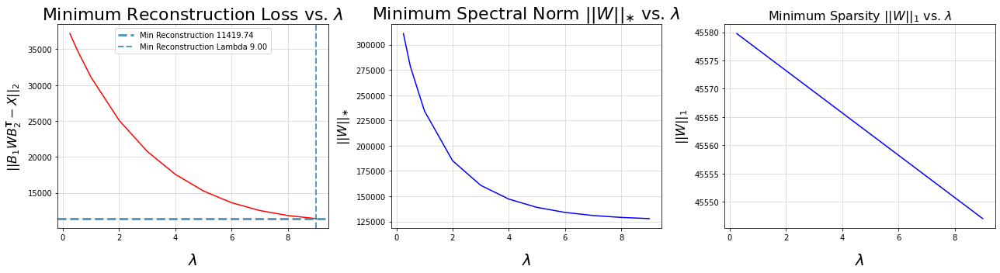

In [118]:
min_reconstruction = [min(results_low_rank_compresssion_4[l]['reconstruction']) for l in results_low_rank_compresssion_4.keys()]
final_spectral = [min(results_low_rank_compresssion_4[l]['spectral']) for l in results_low_rank_compresssion_4.keys()]
final_sparse = [min(results_low_rank_compresssion_4[l]['sparsity']) for l in results_low_rank_compresssion_4.keys()]
lambda_vals = list(results_low_rank_compresssion_4.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_low_rank_compresssion_4.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)

axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_low_rank_compresssion_4.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_low_rank_compresssion_4.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Low Rank, Compression Rate of 4", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("Low_rank_compression_4_hyperparam_plots.png", dpi=400)
plt.show()

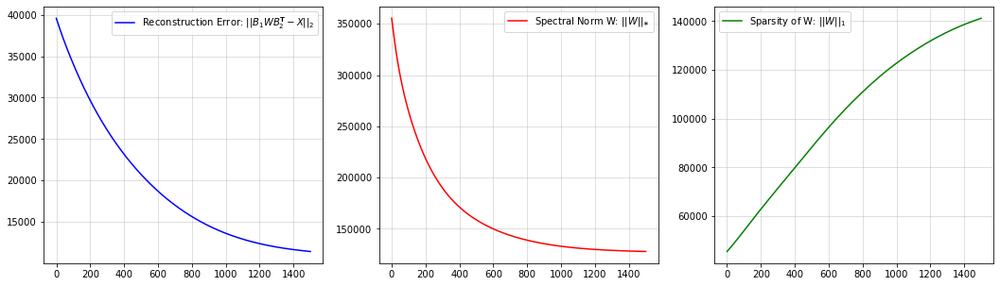

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

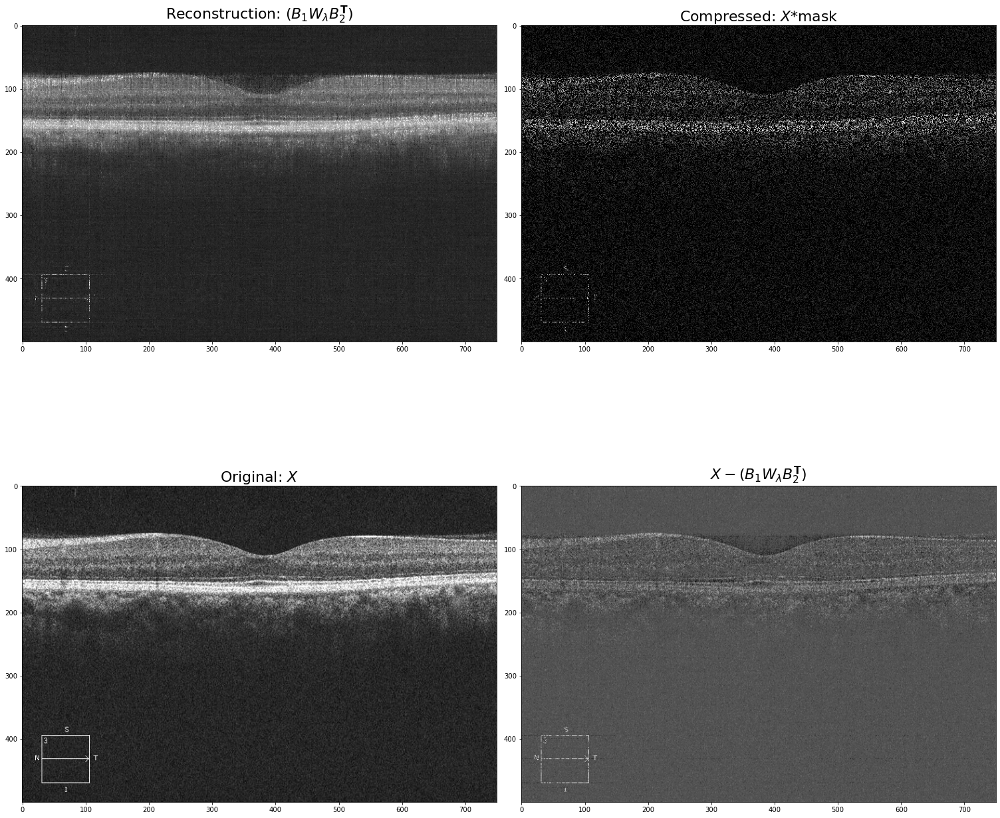

In [127]:
lbda_ = 9
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_low_rank_compresssion_4[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_low_rank_compresssion_4[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_low_rank_compresssion_4[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

# fig.suptitle(f"Low Rank Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

fig.set_facecolor('white')
plt.savefig("Low_rank_compression_4_lambda_9_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_low_rank_compresssion_4[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[1], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_low_rank_compresssion_4[lbda_]['W'] @ B2t), cmap="gray")

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("Low_rank_compression_4_lambda_9_grid.png", dpi=400)
plt.show()

In [98]:
iters = 750

results_sparse_compresssion_3
lbda_search_space

for lbda in lbda_search_space:
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[0]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[0], B1, B2t, W, compressed_images[0], a)
        W = SoftThresh(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_sparse_compresssion_3[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 3
	Iteration 1:	Reconstruction Error: 37224.65	Spectral Norm W: 396271.64	Sparisty of W: 60339.01
	Iteration 51:	Reconstruction Error: 34217.70	Spectral Norm W: 374310.54	Sparisty of W: 66750.21
	Iteration 101:	Reconstruction Error: 31517.10	Spectral Norm W: 358774.30	Sparisty of W: 73232.24
	Iteration 151:	Reconstruction Error: 29050.37	Spectral Norm W: 345057.92	Sparisty of W: 79479.98
	Iteration 201:	Reconstruction Error: 26781.28	Spectral Norm W: 331843.20	Sparisty of W: 85455.24
	Iteration 251:	Reconstruction Error: 24690.79	Spectral Norm W: 318886.77	Sparisty of W: 91102.37
	Iteration 301:	Reconstruction Error: 22769.47	Spectral Norm W: 306211.30	Sparisty of W: 96442.85
	Iteration 351:	Reconstruction Error: 21011.68	Spectral Norm W: 293908.91	Sparisty of W: 101432.88
	Iteration 401:	Reconstruction Error: 19413.00	Spectral Norm W: 282139.10	Sparisty of W: 106058.06
	Iteration 451:	Reconstruction Error: 17969.33	Spectral Norm W: 2710

	Iteration 301:	Reconstruction Error: 9295.23	Spectral Norm W: 181536.07	Sparisty of W: 145581.02
	Iteration 351:	Reconstruction Error: 9296.14	Spectral Norm W: 181580.61	Sparisty of W: 145602.65
	Iteration 401:	Reconstruction Error: 9296.59	Spectral Norm W: 181601.72	Sparisty of W: 145612.97
	Iteration 451:	Reconstruction Error: 9296.81	Spectral Norm W: 181612.18	Sparisty of W: 145618.11
	Iteration 501:	Reconstruction Error: 9296.92	Spectral Norm W: 181617.50	Sparisty of W: 145620.75
	Iteration 551:	Reconstruction Error: 9296.98	Spectral Norm W: 181620.28	Sparisty of W: 145622.16
	Iteration 601:	Reconstruction Error: 9297.01	Spectral Norm W: 181621.77	Sparisty of W: 145622.92
	Iteration 651:	Reconstruction Error: 9297.03	Spectral Norm W: 181622.57	Sparisty of W: 145623.34
	Iteration 701:	Reconstruction Error: 9297.04	Spectral Norm W: 181623.02	Sparisty of W: 145623.58
Starting Optimizer with lambda=5.0, compression 3
	Iteration 1:	Reconstruction Error: 36107.46	Spectral Norm W: 357970

	Iteration 651:	Reconstruction Error: 9383.70	Spectral Norm W: 147393.53	Sparisty of W: 143314.13
	Iteration 701:	Reconstruction Error: 9383.70	Spectral Norm W: 147393.53	Sparisty of W: 143314.13


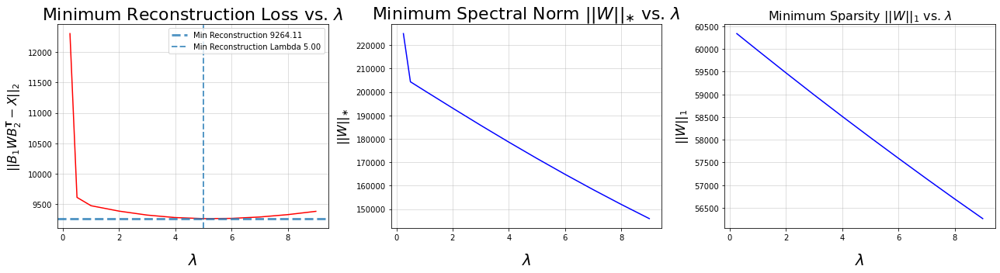

In [119]:
min_reconstruction = [min(results_sparse_compresssion_3[l]['reconstruction']) for l in results_sparse_compresssion_3.keys()]
final_spectral = [min(results_sparse_compresssion_3[l]['spectral']) for l in results_sparse_compresssion_3.keys()]
final_sparse = [min(results_sparse_compresssion_3[l]['sparsity']) for l in results_sparse_compresssion_3.keys()]
lambda_vals = list(results_sparse_compresssion_3.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_sparse_compresssion_3.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)
axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_sparse_compresssion_3.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_sparse_compresssion_3.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Sparse, Compression Rate of 3", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("sparse_compression_3_hyperparam_plots.png", dpi=400)
plt.show()

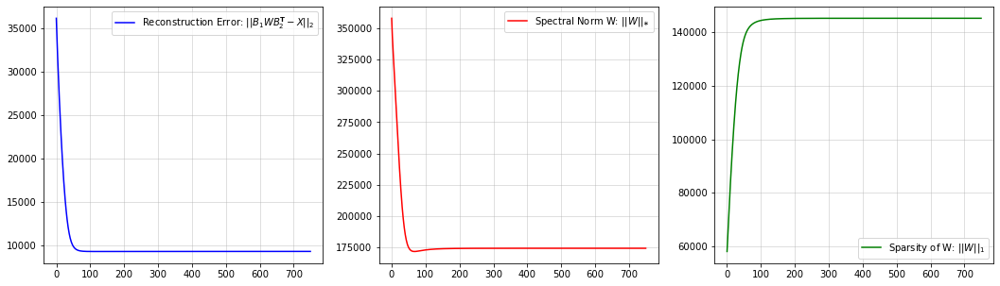

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

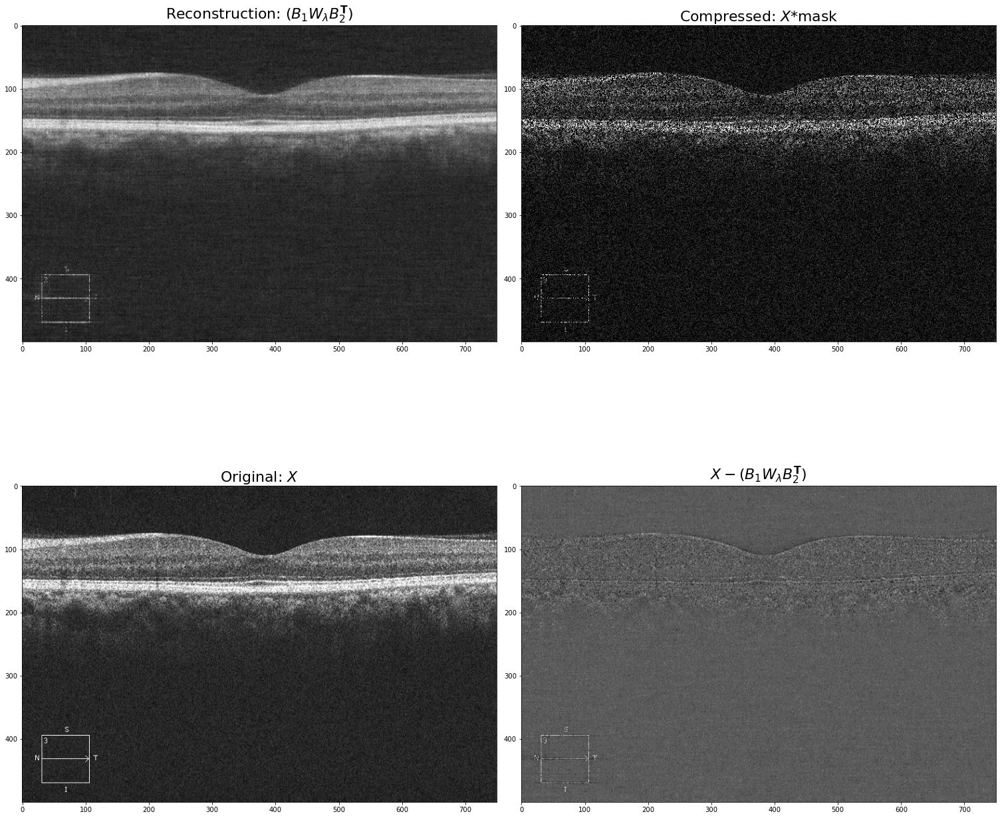

In [128]:
lbda_ = 5
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_sparse_compresssion_3[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_sparse_compresssion_3[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_sparse_compresssion_3[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

# fig.suptitle(f"Sparse Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)
fig.set_facecolor('white')
plt.savefig("sparse_compression_3_lambda_5_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_sparse_compresssion_3[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_sparse_compresssion_3[lbda_]['W'] @ B2t), cmap="gray")

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("sparse_compression_3_lambda_5_grid.png", dpi=400)
plt.show()

In [103]:
iters = 750

for lbda in lbda_search_space:
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[1]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[1], B1, B2t, W, compressed_images[1], a)
        W = SoftThresh(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_sparse_compresssion_4[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 4
	Iteration 1:	Reconstruction Error: 32264.97	Spectral Norm W: 433469.62	Sparisty of W: 83796.24
	Iteration 51:	Reconstruction Error: 28799.85	Spectral Norm W: 372667.02	Sparisty of W: 85017.21
	Iteration 101:	Reconstruction Error: 26012.93	Spectral Norm W: 333188.44	Sparisty of W: 87914.50
	Iteration 151:	Reconstruction Error: 23713.16	Spectral Norm W: 306326.27	Sparisty of W: 91597.44
	Iteration 201:	Reconstruction Error: 21767.66	Spectral Norm W: 286756.98	Sparisty of W: 95553.65
	Iteration 251:	Reconstruction Error: 20095.78	Spectral Norm W: 271489.75	Sparisty of W: 99500.90
	Iteration 301:	Reconstruction Error: 18650.47	Spectral Norm W: 259041.23	Sparisty of W: 103315.81
	Iteration 351:	Reconstruction Error: 17397.63	Spectral Norm W: 248621.34	Sparisty of W: 106885.07
	Iteration 401:	Reconstruction Error: 16315.62	Spectral Norm W: 239825.82	Sparisty of W: 110190.32
	Iteration 451:	Reconstruction Error: 15387.25	Spectral Norm W: 232

	Iteration 301:	Reconstruction Error: 10221.96	Spectral Norm W: 176530.88	Sparisty of W: 140271.97
	Iteration 351:	Reconstruction Error: 10224.23	Spectral Norm W: 176643.67	Sparisty of W: 140315.15
	Iteration 401:	Reconstruction Error: 10225.48	Spectral Norm W: 176705.26	Sparisty of W: 140338.44
	Iteration 451:	Reconstruction Error: 10226.18	Spectral Norm W: 176740.08	Sparisty of W: 140351.65
	Iteration 501:	Reconstruction Error: 10226.57	Spectral Norm W: 176760.29	Sparisty of W: 140359.34
	Iteration 551:	Reconstruction Error: 10226.81	Spectral Norm W: 176772.35	Sparisty of W: 140364.05
	Iteration 601:	Reconstruction Error: 10226.95	Spectral Norm W: 176779.73	Sparisty of W: 140366.99
	Iteration 651:	Reconstruction Error: 10227.04	Spectral Norm W: 176784.31	Sparisty of W: 140368.82
	Iteration 701:	Reconstruction Error: 10227.10	Spectral Norm W: 176787.20	Sparisty of W: 140369.97
Starting Optimizer with lambda=5.0, compression 4
	Iteration 1:	Reconstruction Error: 30891.51	Spectral Norm 

	Iteration 601:	Reconstruction Error: 10188.30	Spectral Norm W: 141001.18	Sparisty of W: 138036.75
	Iteration 651:	Reconstruction Error: 10188.30	Spectral Norm W: 141001.18	Sparisty of W: 138036.75
	Iteration 701:	Reconstruction Error: 10188.30	Spectral Norm W: 141001.18	Sparisty of W: 138036.75


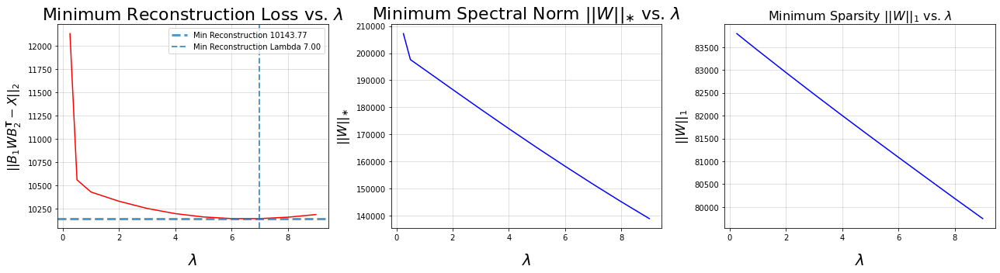

In [120]:
min_reconstruction = [min(results_sparse_compresssion_4[l]['reconstruction']) for l in results_sparse_compresssion_4.keys()]
final_spectral = [min(results_sparse_compresssion_4[l]['spectral']) for l in results_sparse_compresssion_4.keys()]
final_sparse = [min(results_sparse_compresssion_4[l]['sparsity']) for l in results_sparse_compresssion_4.keys()]
lambda_vals = list(results_sparse_compresssion_4.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_sparse_compresssion_4.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)
axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_sparse_compresssion_4.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_sparse_compresssion_4.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Sparse, Compression Rate of 4", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("sparse_compression_4_hyperparam_plots.png", dpi=400)
plt.show()

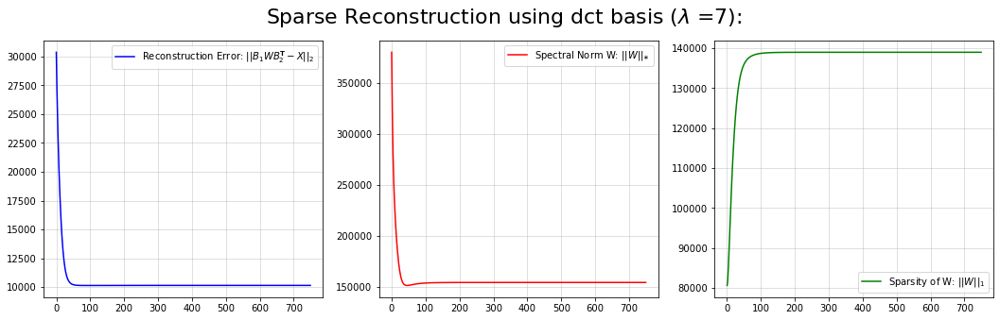

Resulting Reconstruction:


<Figure size 432x288 with 0 Axes>

<Figure size 1008x648 with 0 Axes>

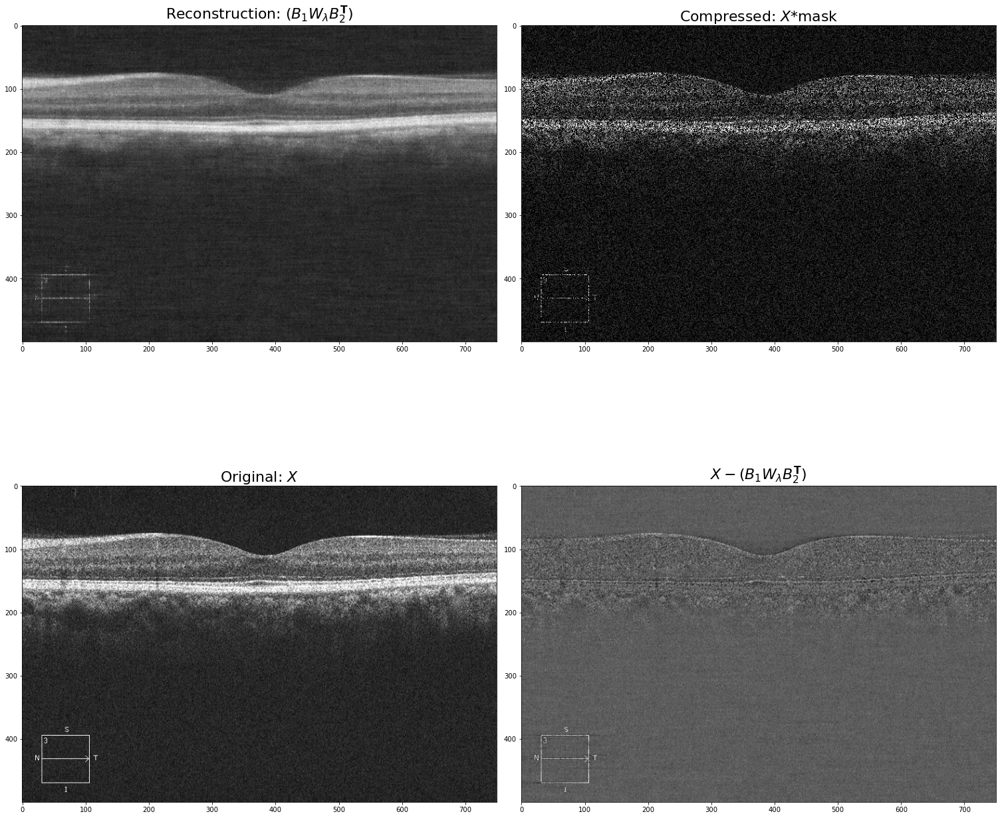

In [129]:
lbda_ = 7
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_sparse_compresssion_4[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_sparse_compresssion_4[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_sparse_compresssion_4[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

fig.suptitle(f"Sparse Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

plt.show();
fig.set_facecolor('white')
plt.savefig("sparse_compression_4_lambda_7_plots.png", dpi=400)

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_sparse_compresssion_4[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_sparse_compresssion_4[lbda_]['W'] @ B2t), cmap="gray")

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig("sparse_compression_4_lambda_7_grid.png", dpi=400)
plt.show()